In [69]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.insert(1, '/home/jw3514/Work/CellType_Psy/src')
sys.path.insert(1, '/home/jw3514/Work/UNIMED/src')
from CellType_PSY import *
from UNIMED import *
import yaml
#import scanpy as sc
HGNC, ENSID2Entrez, GeneSymbol2Entrez, Entrez2Symbol = LoadGeneINFO()

os.chdir("/home/jw3514/Work/UNIMED/notebooks/")

with open("../config/config.yaml", "r") as f:
    config = yaml.safe_load(f)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
bias_path = config["bias_matrices"]["MouseSTR"]
BiasMat = pd.read_parquet(bias_path)
BiasMat.head()

,Anterior_amygdalar_area,Anterior_cingulate_area_dorsal_part,Anterior_cingulate_area_ventral_part,Nucleus_accumbens,Anterodorsal_nucleus,Anterior_hypothalamic_nucleus,Agranular_insular_area_dorsal_part,Agranular_insular_area_posterior_part,Agranular_insular_area_ventral_part,Nucleus_ambiguus,...,Primary_visual_area,Posterolateral_visual_area,posteromedial_visual_area,Ventral_medial_nucleus_of_the_thalamus,Ventromedial_hypothalamic_nucleus,Ventral_posterolateral_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus_parvicellular_part,Ventral_tegmental_area,Hypoglossal_nucleus
1,0.409837,-0.581435,-0.594606,-0.800554,-0.782203,1.696205,-0.905862,NaN,-0.385306,-0.505779,...,-0.941669,1.135876,-1.144142,-0.212505,1.221017,-0.112535,0.223401,-0.177226,1.284936,0.738990
2,-0.439982,-0.589145,-0.496139,-0.521484,0.106047,-0.407245,-0.018364,-0.398513,-0.208207,-0.480868,...,-0.499681,-0.523493,-0.152573,-0.275961,-0.373536,-0.539785,-0.543094,-0.382633,0.036790,1.109502
131076,1.545036,-1.376463,-1.582020,-0.804973,-0.268058,-1.303032,-0.306551,0.192133,-0.662855,1.553128,...,-0.914177,-1.536790,-0.827520,-0.611241,-0.250607,2.079513,1.383803,1.560648,0.808778,2.126709
9,-0.074561,0.226121,0.308028,-1.071384,0.008005,-0.644131,-0.707363,-0.499201,-0.810724,-0.003223,...,-0.644883,-0.605185,-0.763023,-0.621743,0.552656,-0.695107,-0.729302,-0.584784,-0.300117,0.063816
10,-0.039672,0.225181,0.325189,-1.089473,-0.003844,-0.657787,-0.716346,-0.494861,-0.760499,0.009242,...,-0.623292,-0.604452,-0.752981,-0.634637,0.532088,-0.675380,-0.706362,-0.587613,-0.300050,0.068550


In [3]:
PGC_Magma_Correlation = pd.read_csv("/home/jw3514/Work/UNIMED/results/pfactor/PGC_Magma_Correlation.csv", index_col=0)

# Mouse STR

In [4]:
# Read Magma GWAS Results
gwas = "PGC"
Exclude = "Empty"
Mode = "MouseSTR"
Bias = "top_gene_enrich"

PGC_Trait_Names = ["ASD", "SCZ", "BP", "ADHD", "MDD", "OCD", "TS", "PD", "AN", "EDU", "PTSD"]

DIR = f"/home/jw3514/Work/UNIMED/results/assoc/{gwas}/{Mode}/{Bias}.{Exclude}"
Psy_GWAS_CTBias_DF = {}
for Name in PGC_Trait_Names:
    Psy_GWAS_CTBias_DF[Name] = pd.read_csv("{}/MouseSTR.{}.csv".format(DIR,Name), sep=",", index_col=0)

Psy_GWAS_CTBias_DF["SCZ"].head()

,beta,pvalue,Region,Rank
Structure,,,,
Field_CA1,0.261398,4.509498e-10,Hippocampus,1
Dentate_gyrus,0.260308,4.621373e-10,Hippocampus,2
Lateral_dorsal_nucleus_of_thalamus,0.211778,4.305519e-07,Thalamus,3
Primary_auditory_area,0.202677,1.607659e-06,Isocortex,4
Field_CA2,0.201951,1.472740e-06,Hippocampus,5


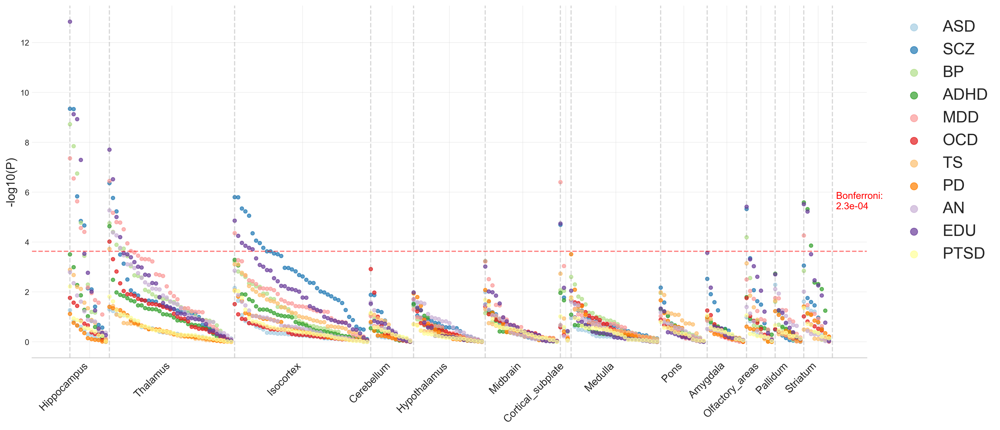

In [5]:
def plot_class_label_specificity(
    Psy_GWAS_CTBias_DF, 
    Disorders, 
    colors, 
    n_tests=213, 
    figsize=(20, 9), 
    dpi=360
):
    # Create figure with extra bottom margin for rotated labels and transparent background
    plt.figure(figsize=figsize, dpi=dpi, facecolor='none', edgecolor='none')
    ax = plt.gca()
    ax.set_facecolor('none')

    # Process first disorder to establish common Region ordering
    df_first = Psy_GWAS_CTBias_DF[Disorders[0]].copy()
    class_means = df_first.groupby('Region')['beta'].mean().sort_values(ascending=False)
    sorted_classes = class_means.index.tolist()

    # Will be overwritten in each loop, but we want the last one for boundaries
    class_boundaries = []

    # Process each disorder using the same Region ordering
    for disorder, color in zip(Disorders, colors):
        df = Psy_GWAS_CTBias_DF[disorder].copy()
        
        # Convert values to -log10(1-p)
        df['value'] = -np.log10(df['pvalue'])
        
        # Sort data using common Region ordering
        df['class_order'] = df['Region'].map({cl: i for i, cl in enumerate(sorted_classes)})
        df = df.sort_values(['class_order', 'value'], ascending=[True, False])
        
        # Get class grouping info
        class_groups = {cl: df[df['Region'] == cl].index for cl in sorted_classes}
        
        # Calculate class boundaries
        class_boundaries = []
        current_pos = 0
        for cl in sorted_classes:
            indices = [df.index.get_loc(idx) for idx in class_groups[cl]]
            class_boundaries.append(current_pos)
            current_pos += len(indices)
        class_boundaries.append(current_pos)
        
        # Plot points for this disorder
        plt.scatter(range(len(df)), df['value'], alpha=0.7, color=color, label=disorder, s=20)

    # Add vertical lines at class boundaries
    for boundary in class_boundaries:
        plt.axvline(x=boundary, color='gray', linestyle='--', alpha=0.3)

    # Add horizontal line at Bonferroni threshold
    bonferroni_threshold = -np.log10(0.05/n_tests)
    plt.axhline(y=bonferroni_threshold, color='red', linestyle='--', alpha=0.5)
    # annotate its pvalue
    plt.text(n_tests+1, bonferroni_threshold + 2, f'Bonferroni: \n{0.05/n_tests:.1e}', ha='left', va='center', fontsize=12, color='red')

    # Calculate center position for each class
    class_centers = {}
    for i, cl in enumerate(sorted_classes):
        class_centers[cl] = (class_boundaries[i] + class_boundaries[i+1]) / 2

    # Add class labels at center positions
    plt.xticks([class_centers[cl] for cl in sorted_classes], 
               sorted_classes,
               rotation=45,
               fontsize=13,
               ha='right')

    # Customize plot
    #plt.xlabel('Cell Type Classes')
    plt.ylabel('-log10(P)', fontsize=15)
    #plt.title('Cell Type Specificity Across Psychiatric Disorders')
    plt.grid(True, alpha=0.3)

    # Move legend outside of plot
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=20, markerscale=2)
    # remove top and right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

    # Adjust layout to prevent label cutoff and accommodate legend
    plt.subplots_adjust(bottom=0.2, right=0.85)
    plt.show()

# Example usage:
# plot_class_label_specificity(Psy_GWAS_CTBias_DF, PGC_Trait_Names, colors)
colors = [
    "#a6cee3", "#1f78b4", "#b2df8a", "#33a02c", "#fb9a99",
    "#e31a1c", "#fdbf6f", "#ff7f00", "#cab2d6", "#6a3d9a", "#ffff99"
]
plot_class_label_specificity(Psy_GWAS_CTBias_DF, PGC_Trait_Names, colors, n_tests=BiasMat.shape[1])

In [6]:
PsyDisorders_2 = ["ASD", "SCZ", "BP", "ADHD", "MDD", "OCD","TS", "AN", "PTSD", "PD", "EDU"]
#h2_LDSC = [0.118, 0.244, 0.196, 0.199, 0.103, 0.367, 0.252, 0.044, 0.09, ]
h2_LDSC = np.array([0.118, 0.244, 0.196, 0.199, 0.103, 0.28, 0.252, 0.044, 0.09, 0.148, 0.03])
h2_se_LDSC = [0.012, 0.0095, 0.0111, 0.0128, 0.0072, 0.0589, 0.0332, 0.0034, 0.0083, 0.002, 0.003]
SampleSize = [18381, 76755, 41917, 38691 , 88316, 2688, 4819, 74973, 11920, 10000, 2248]
neff_values = np.array([
    21945,   # ASD
    55115,   # SCZ
    71385,   # BP
    26126,   # ADHD
    1014821,   # MDD
    38193,    # OCD
    6371,    # TS
    36647,   # Anxiety
    17531,   # PTSD
    3265,    # PD (Panic Disorder)
    405072   # EDU
])

In [7]:
N_sigCT_list = []
N_sig_count_list = []
for disorder in PsyDisorders_2:
    # Get number of significant cell types (p < 0.05/200)
    N_sig_count = len(Psy_GWAS_CTBias_DF[disorder][Psy_GWAS_CTBias_DF[disorder]["pvalue"] < 0.05/200])
    N_sig_count_list.append(N_sig_count)
    
    # Get mean effect size of top 50 cell types
    N_sigCT = Psy_GWAS_CTBias_DF[disorder].head(50)["beta"].mean()
    N_sigCT_list.append(N_sigCT)

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


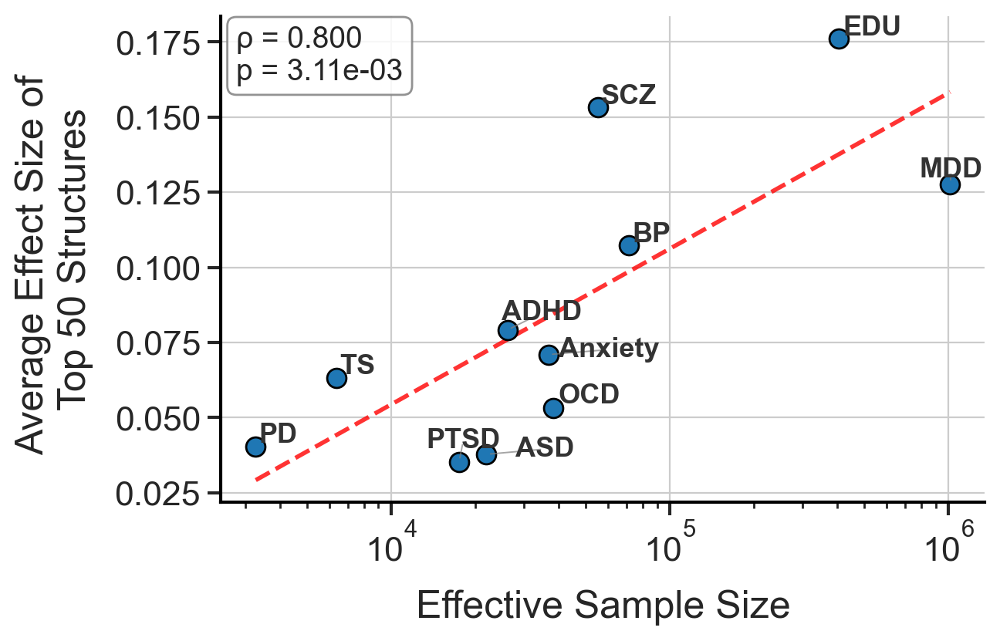

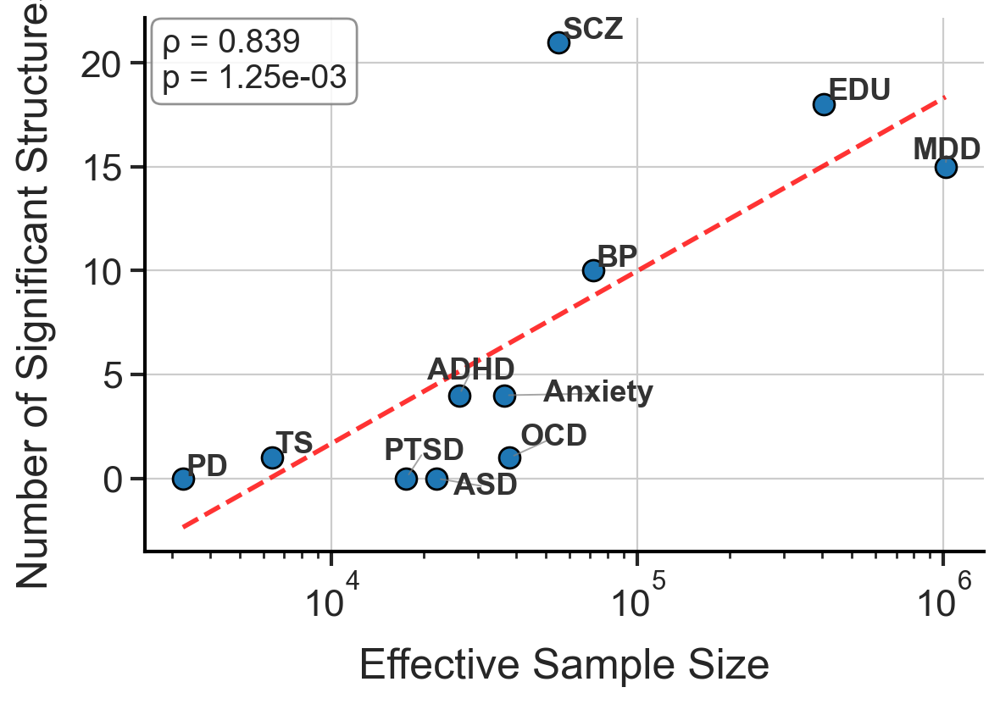

In [8]:


create_scatter_plot(
    x_values=neff_values,
    y_values=N_sigCT_list,
    xlabel="Effective Sample Size",
    ylabel="Average Effect Size of \nTop 50 Structures", 
    disorders=['ASD', 'SCZ', 'BP', 'ADHD', 'MDD', 'OCD', 'TS', 'Anxiety', 'PTSD', 'PD', 'EDU']
)

# Plot number of significant cell types vs sample size  
create_scatter_plot(
    x_values=neff_values,
    y_values=N_sig_count_list,
    xlabel="Effective Sample Size",
    ylabel="Number of Significant Structures",
    disorders=['ASD', 'SCZ', 'BP', 'ADHD', 'MDD', 'OCD', 'TS', 'Anxiety', 'PTSD', 'PD', 'EDU']
)

In [9]:
All_Bias_DF_Spec = pd.read_csv("/home/jw3514/Work/UNIMED/results/pca/PGC/MouseSTR/top_gene_enrich.Empty/combined_bias_data.csv", index_col=0)
All_Bias_DF_Spec.head()

,PD,AN,TS,BP,ADHD,EDU,SCZ,PTSD,MDD,ASD,OCD
Structure,,,,,,,,,,,
Accessory_olfactory_bulb,0.000134,0.003352,-0.002646,0.143739,0.033944,0.164714,0.194401,-0.016299,0.071601,-0.010648,0.047068
Agranular_insular_area_dorsal_part,0.008347,-0.022480,0.055732,-0.037401,0.014376,0.034482,0.041844,0.015871,0.024102,-0.007642,0.012410
Agranular_insular_area_posterior_part,0.027259,-0.033912,0.031481,0.010583,-0.015814,-0.077956,-0.011778,-0.012264,-0.007768,-0.016243,-0.031299
Agranular_insular_area_ventral_part,0.037075,-0.007121,0.031101,0.042230,0.006702,0.074117,0.104752,0.014841,0.070533,-0.022352,0.004316
Ansiform_lobule,0.014068,-0.053799,-0.040013,0.055767,0.021031,0.068612,0.031625,0.011216,-0.009337,-0.011388,-0.046147


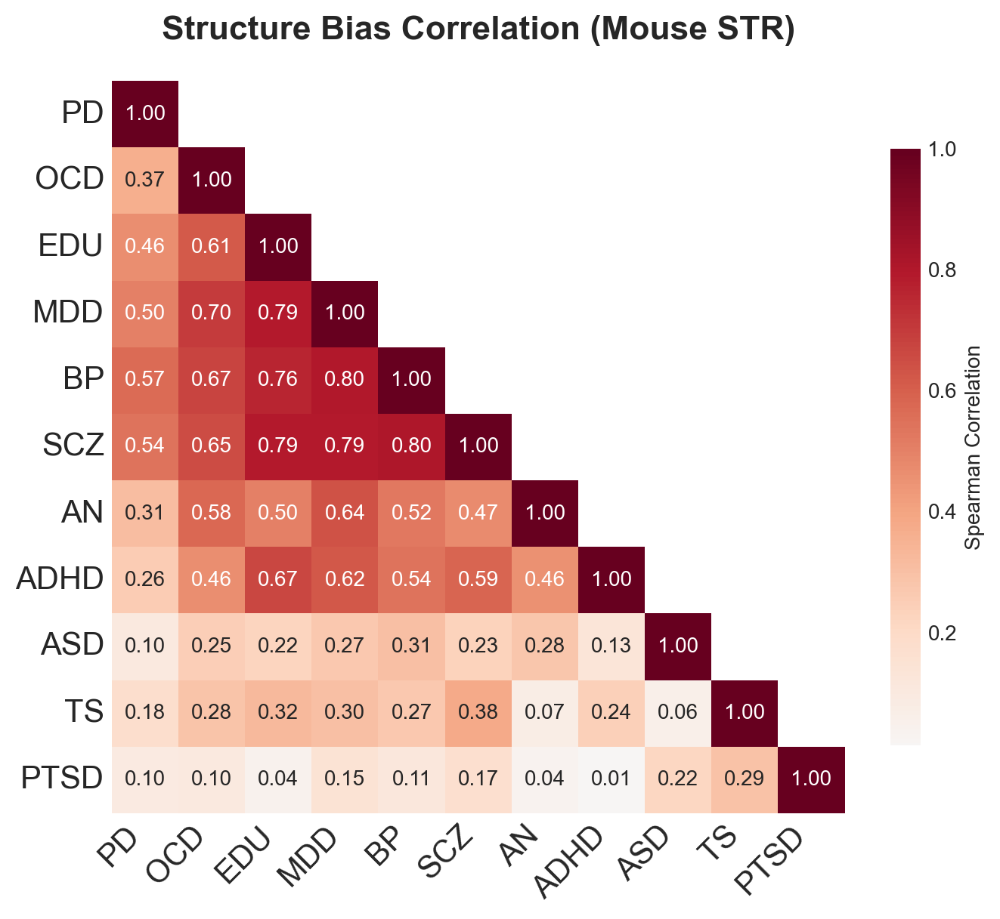

In [10]:
MouseSTR_Bias_Correlation = plot_disorder_correlation_heatmap(All_Bias_DF_Spec, "Structure Bias Correlation (Mouse STR)")

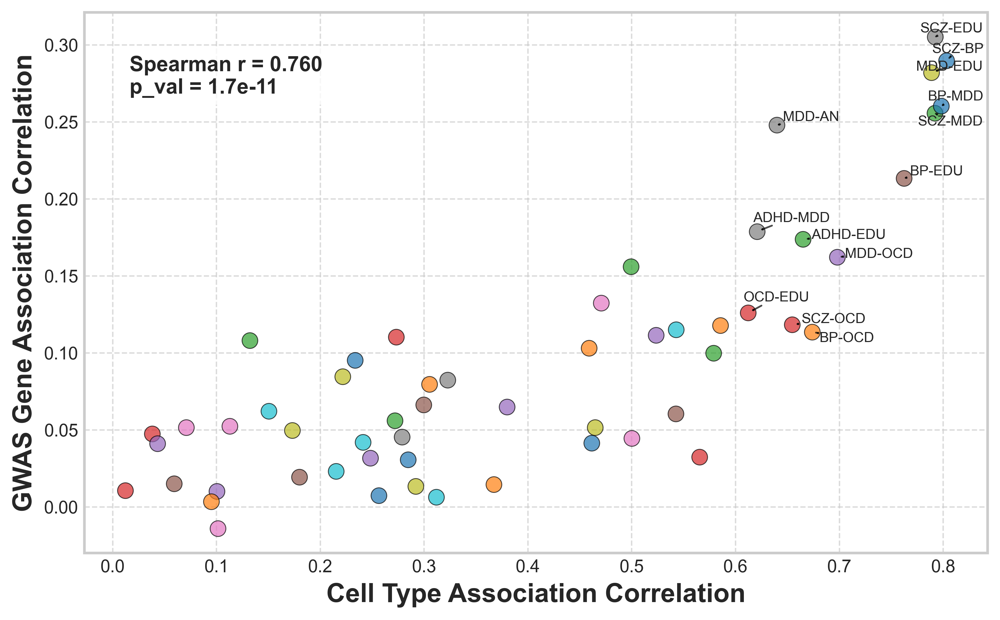

In [11]:
# Filter out meta-analysis disorders
disorders = PGC_Trait_Names

# Set figure style and size 
plt.style.use('seaborn-v0_8-whitegrid')  # Use 'seaborn' instead of deprecated 'seaborn-whitegrid'
plt.figure(figsize=(8, 5), dpi=480)

# Calculate Spearman correlation
x_values = []
y_values = []
annotations = []
for i, disorder1 in enumerate(disorders):
    for disorder2 in disorders[i+1:]:
        corr = MouseSTR_Bias_Correlation.loc[disorder1, disorder2]
        x_values.append(corr)
        y_values.append(PGC_Magma_Correlation.loc[disorder1, disorder2])
        if corr > 0.6:
            annotations.append((corr, PGC_Magma_Correlation.loc[disorder1, disorder2], f"{disorder1}-{disorder2}"))

spearman_corr, p_val = stats.spearmanr(x_values, y_values)

# Get all unique disorder pairs and plot
for i, disorder1 in enumerate(disorders):
    for disorder2 in disorders[i+1:]:
        plt.scatter(MouseSTR_Bias_Correlation.loc[disorder1, disorder2],
                   PGC_Magma_Correlation.loc[disorder1, disorder2],
                   alpha=0.7,
                   s=80,
                   edgecolor='black',
                   linewidth=0.5)

# Add annotations for pairs with correlation > 0.8 using adjustText
texts = []
for x, y, label in annotations:
    texts.append(plt.text(x, y, label, fontsize=8))

# Use adjustText to prevent overlapping labels
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', alpha=0.7))

# Add Spearman correlation text to plot
plt.text(0.05, 0.85, f'Spearman r = {spearman_corr:.3f}\np_val = {p_val:.1e}',
         transform=plt.gca().transAxes,
         fontsize=12,
         fontweight='bold',
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

# Customize plot appearance
plt.xlabel("Cell Type Association Correlation", fontsize=15, fontweight='bold')
plt.ylabel("GWAS Gene Association Correlation", fontsize=15, fontweight='bold')
#plt.title("Cell Type Bias vs Gene level association \nAcross Psychiatric Disorders",
#         fontsize=14, fontweight='bold', pad=15)

# Add grid and adjust spines
plt.grid(True, linestyle='--', alpha=0.7)
for spine in plt.gca().spines.values():
    spine.set_linewidth(1.5)
    
plt.tight_layout()
plt.show()


In [12]:
MouseSTR_Bias_Correlation.to_csv("/home/jw3514/Work/UNIMED/results/pfactor/PGC_MouseSTR_Correlation.csv")

In [13]:
MouseSTR_Bias_scaled, mouseSTR_bias_pca, mouseSTR_bias_pca_result, mouseSTR_bias_loadings = perform_pca_analysis(All_Bias_DF_Spec)
mouseSTR_bias_pc_scores_df = pd.DataFrame(
    mouseSTR_bias_pca_result,   
    index=All_Bias_DF_Spec.index,
    columns=[f'PC{i+1}' for i in range(mouseSTR_bias_pca_result.shape[1])]
)

Explained variance ratios:
PC1: 0.490 (49.0%)
PC2: 0.112 (11.2%)
PC3: 0.095 (9.5%)
PC4: 0.073 (7.3%)
PC5: 0.059 (5.9%)
PC6: 0.052 (5.2%)
PC7: 0.041 (4.1%)
PC8: 0.029 (2.9%)
PC9: 0.018 (1.8%)
PC10: 0.016 (1.6%)
PC11: 0.014 (1.4%)

Cumulative variance explained: 100.0%

PC1 loadings:
MDD     0.394747
SCZ     0.384551
BP      0.383095
EDU     0.377762
OCD     0.337629
AN      0.293112
ADHD    0.290528
PD      0.244140
TS      0.183892
ASD     0.150579
PTSD    0.080126
Name: PC1, dtype: float64


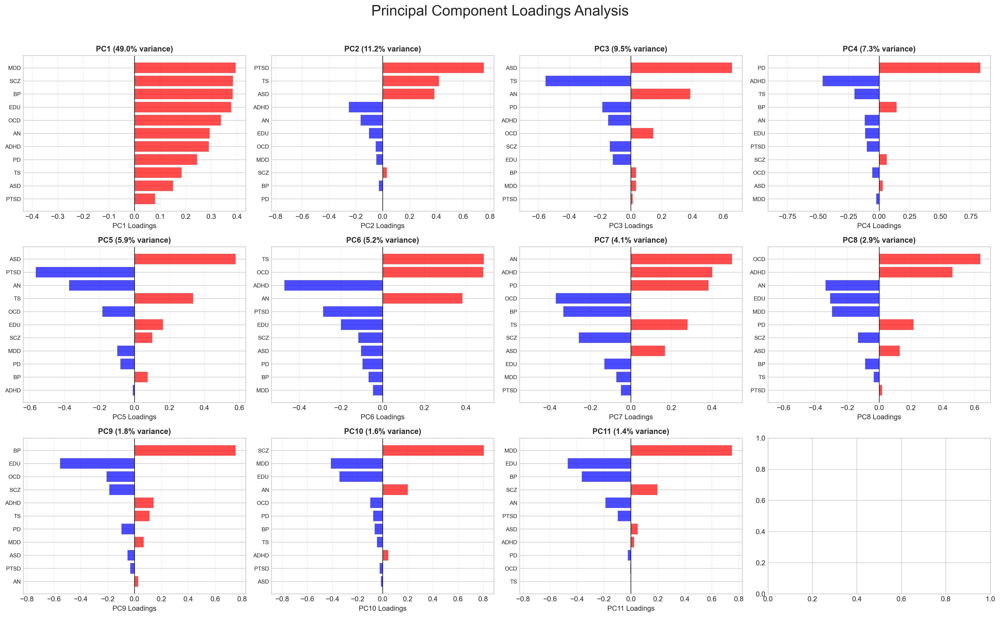

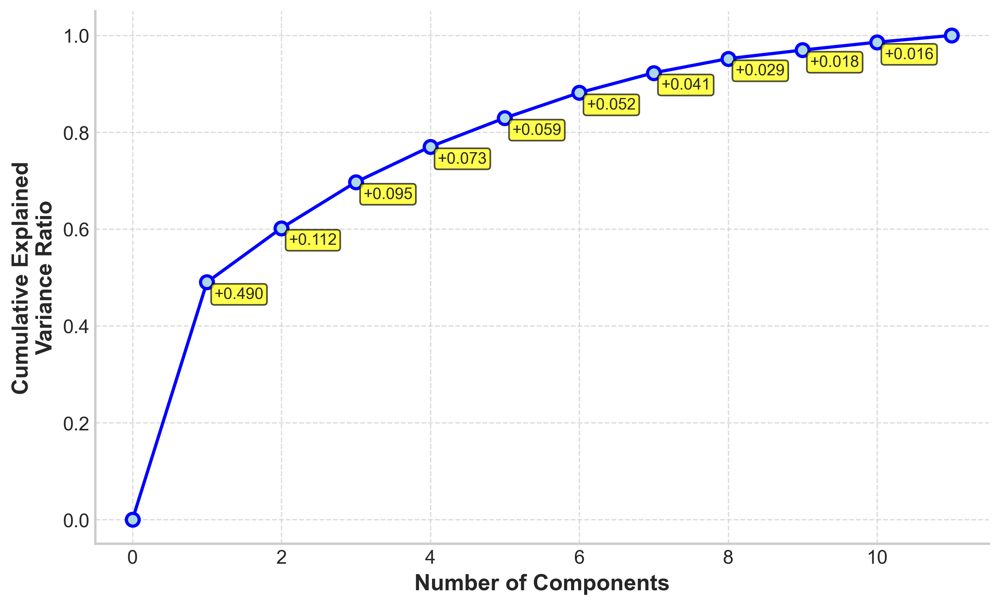

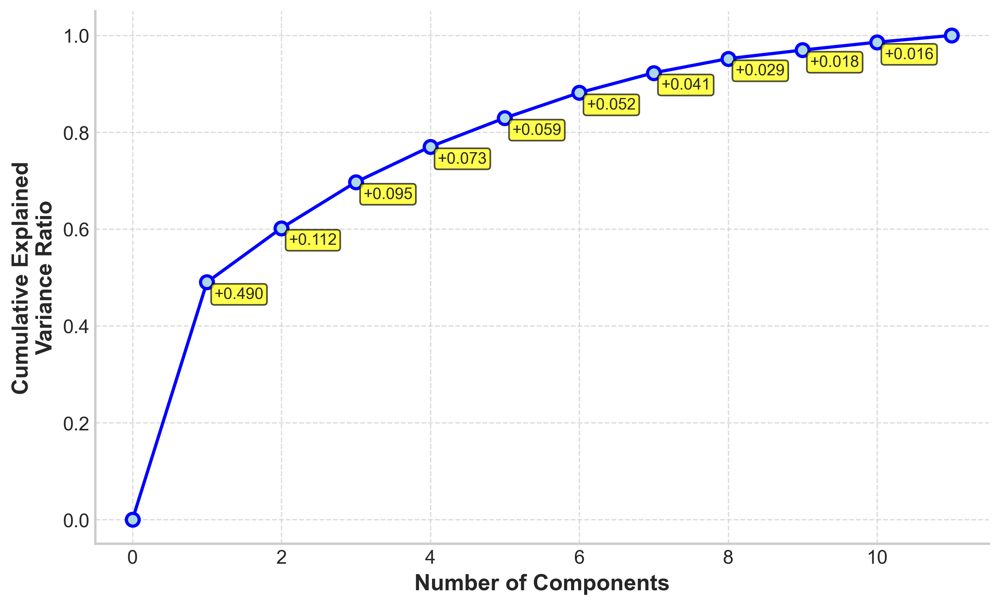

In [14]:
plot_pc_loadings(mouseSTR_bias_pca, All_Bias_DF_Spec)
plot_scree_and_get_loadings(mouseSTR_bias_pca)

In [15]:
mouseSTR_bias_pc_scores_df.to_csv("/home/jw3514/Work/UNIMED/results/pfactor/MouseSTR_PC_Scores.csv")

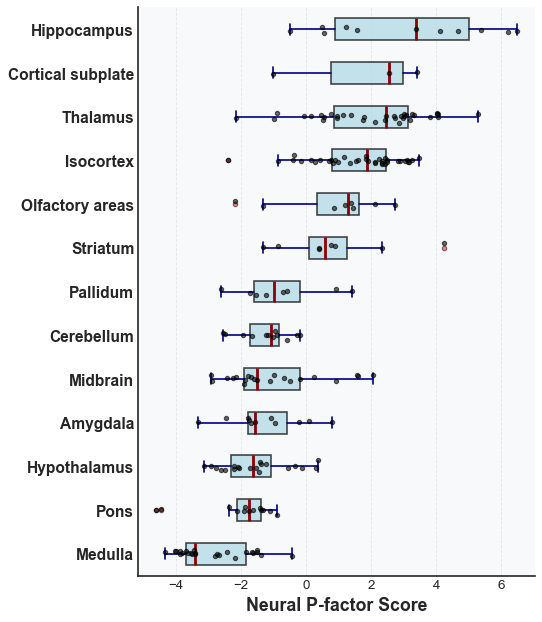

In [71]:
REG2STR = {}
str2reg = STR2Region() 
for structure, region in str2reg.items():
    if region not in REG2STR:
        REG2STR[region] = []
    REG2STR[region].append(structure)
# Create figure
# Create figure
Regions = list(set(str2reg.values()))

plot_pc1_boxplot_MouseSTR(mouseSTR_bias_pc_scores_df, Regions, REG2STR, "PC1", xlabel="Neural P-factor Score")

In [27]:
# For Sibling
from ASD_Circuits import *
ScoreMatDir="/home/jw3514/Work/ASD_Circuits/dat/allen-mouse-conn/ScoreingMat_jw_v3/"
IpsiInfoMat=pd.read_csv(ScoreMatDir + "InfoMat.Ipsi.csv", index_col=0)
IpsiInfoMatShort_v1=pd.read_csv(ScoreMatDir + "InfoMat.Ipsi.Short.3900.csv", index_col=0)
IpsiInfoMatLong_v1=pd.read_csv(ScoreMatDir + "InfoMat.Ipsi.Long.3900.csv", index_col=0)

In [28]:
STR_Ranks = mouseSTR_bias_pc_scores_df.sort_values("PC1", ascending=False).index.values
#STR_Ranks = ASD_Bias.index.values
topNs = list(range(200, 5, -1))
SC_Agg_topN_score = []
SC_Agg_topN_scoreShort = []
SC_Agg_topN_scoreLong = []
for topN in topNs:
    top_strs = STR_Ranks[:topN]
    score = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMat)
    scoreShort = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMatShort_v1)
    scoreLong = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMatLong_v1)
    SC_Agg_topN_score.append(score)
    SC_Agg_topN_scoreShort.append(scoreShort)
    SC_Agg_topN_scoreLong.append(scoreLong)
SC_Agg_topN_score = np.array(SC_Agg_topN_score)
SC_Agg_topN_scoreShort = np.array(SC_Agg_topN_scoreShort)
SC_Agg_topN_scoreLong = np.array(SC_Agg_topN_scoreLong)

/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarning: invalid value encountered in double_scalars
  return score/N_events
/home/jw3514/Work/UNIMED/src/ASD_Circuits.py:422: RuntimeWarni

In [29]:
topNs = np.arange(200, 5, -1)
DIR = "/home/jw3514/Work/ASD_Circuits/scripts/RankScores/"
Cont_Distance = np.load("{}/RankScore.Ipsi.Cont.npy".format(DIR))
Cont_DistanceShort = np.load("{}/RankScore.Ipsi.Short.3900.Cont.npy".format(DIR))
Cont_DistanceLong = np.load("{}/RankScore.Ipsi.Long.3900.Cont.npy".format(DIR))

In [30]:
def plot_circuit_connectivity_scores(topNs, SC_Agg_topN_score, SC_Agg_topN_scoreLong, SC_Agg_topN_scoreShort,
                                  Cont_Distance, Cont_DistanceLong, Cont_DistanceShort):
    fig, (ax1, ax2, ax3) = plt.subplots(3,1, dpi=480, figsize=(7,11))

    BarLen = 34.1
    #BarLen = 47.5

    cont = np.median(Cont_Distance, axis=0)
    ax1.plot(topNs, SC_Agg_topN_score, color="blue", marker="o", markersize=5, lw=1,
                         ls="dashed", label="P-factor")

    lower = np.percentile(Cont_Distance, 50-BarLen, axis=0)
    upper = np.percentile(Cont_Distance, 50+BarLen, axis=0)
    ax1.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
                yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
    ax1.set_xlabel("Structure Rank\n", fontsize=17)
    ax1.set_ylabel("Circuit Connectivity Score", fontsize=15)
    ax1.legend(fontsize=13)

    cont = np.nanmean(Cont_DistanceLong, axis=0)
    ax2.plot(topNs, SC_Agg_topN_scoreLong, color="blue", marker="o", markersize=5, lw=1,
                         ls="dashed", label="P-factor")

    lower = np.nanpercentile(Cont_DistanceLong, 50-BarLen, axis=0)
    upper = np.nanpercentile(Cont_DistanceLong, 50+BarLen, axis=0)
    ax2.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
                yerr=(cont - lower, abs(upper - cont) ), ls="dashed", label="Siblings")
    ax2.set_xlabel("Structure Rank\n", fontsize=17)
    ax2.set_ylabel("Circuit Connectivity Score", fontsize=15)
    ax2.legend(fontsize=13)

    cont = np.median(Cont_DistanceShort, axis=0)
    ax3.plot(topNs, SC_Agg_topN_scoreShort, color="blue", marker="o", markersize=5, lw=1,
                         ls="dashed", label="P-factor")

    lower = np.percentile(Cont_DistanceShort, 50-BarLen, axis=0)
    upper = np.percentile(Cont_DistanceShort, 50+BarLen, axis=0)
    ax3.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
                yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
    ax3.set_xlabel("Structure Rank\n", fontsize=17)
    ax3.set_ylabel("Circuit Connectivity Score", fontsize=15)
    ax3.legend(fontsize=13)

    #fig.text(0.5, -0.03, 'Top Number of Structuress', ha='center')
    #fig.text(-0.03, 0.5, 'SI Score', va='center', rotation='vertical')
    ax1.set_xlim(0, 121)
    ax2.set_xlim(0, 121)
    ax3.set_xlim(0, 121)
    plt.tight_layout()
    #plt.legend(fontsize=15)
    ax1.grid(True)
    ax2.grid(True)
    ax3.grid(True)
    #plt.savefig("../figs/main/Fig2.BCD.pdf")
    #plt.savefig("../figs/main/Fig2.BCD.png")
    return fig

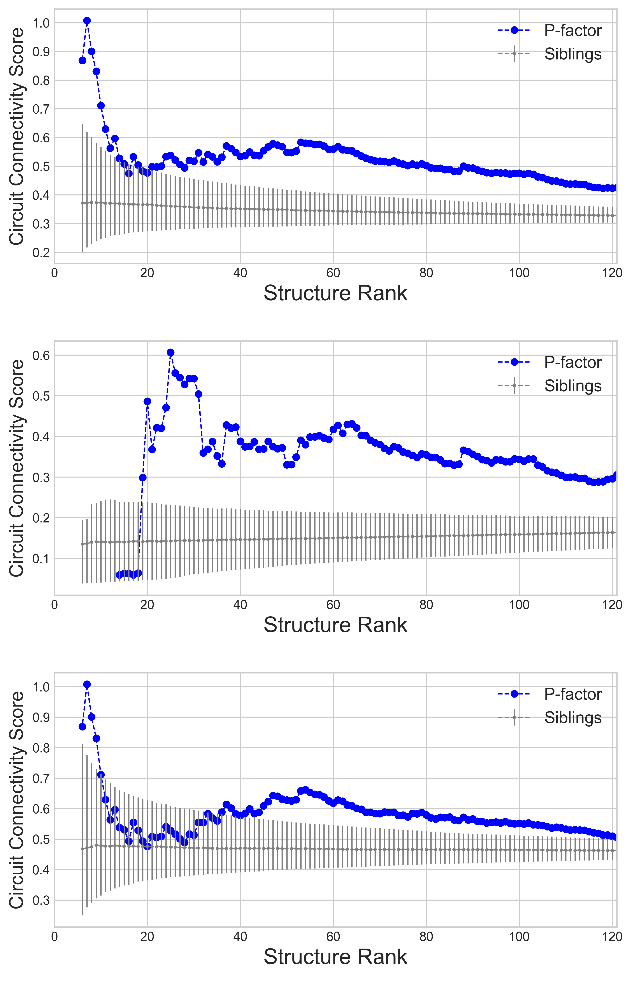

In [31]:
plot_circuit_connectivity_scores(topNs, SC_Agg_topN_score, SC_Agg_topN_scoreLong, SC_Agg_topN_scoreShort,
                                  Cont_Distance, Cont_DistanceLong, Cont_DistanceShort)
plt.show()

In [32]:
def calculate_circuit_scores(pc_scores_df, IpsiInfoMat, sort_by="PC1"):
    STR_Ranks = pc_scores_df.sort_values(sort_by, ascending=False).index.values
    topNs = list(range(200, 5, -1))
    SC_Agg_topN_score = []
    
    for topN in topNs:
        top_strs = STR_Ranks[:topN]
        score = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMat)
        SC_Agg_topN_score.append(score)
        
    return np.array(SC_Agg_topN_score)

In [33]:
PC1_scores = calculate_circuit_scores(mouseSTR_bias_pc_scores_df, IpsiInfoMat)
disorder_scores = {}
for disorder in PGC_Trait_Names:
    df = Psy_GWAS_CTBias_DF[disorder]
    disorder_scores[disorder] = calculate_circuit_scores(df, IpsiInfoMat, sort_by="beta")

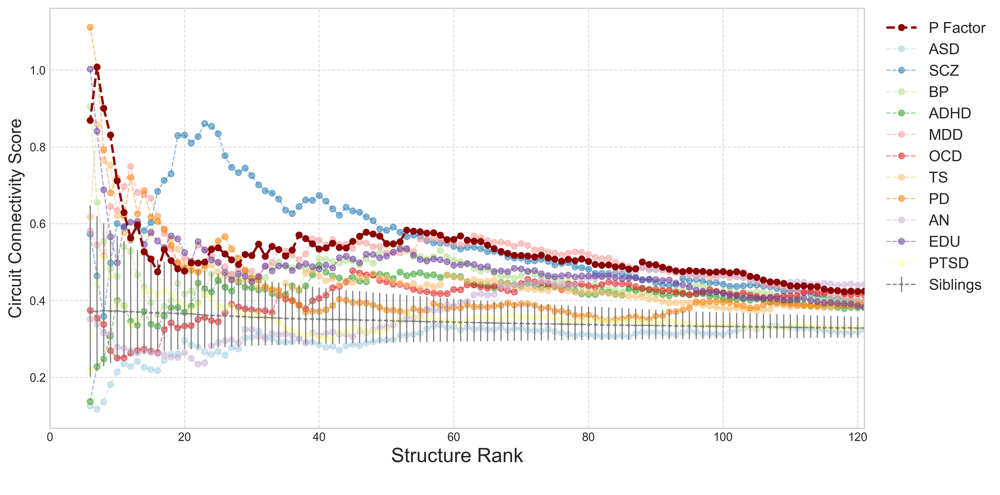

In [34]:
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax1 = plt.subplots(1,1, dpi=480, figsize=(12,6), facecolor='none')

fig.patch.set_alpha(0)
ax1.patch.set_alpha(0)

BarLen = 34.1
#BarLen = 47.5

# Add zorder to ensure line appears on top of other plots
ax1.plot(topNs, PC1_scores, color="darkred", marker="o", markersize=5, lw=2, 
         ls="dashed", label="P Factor", zorder=10, alpha=1.0)
                        
for disorder, color in zip(PGC_Trait_Names, colors):
    ax1.plot(topNs, disorder_scores[disorder], color=color, marker="o", markersize=5, lw=1,
                        ls="dashed", label=disorder, alpha = 0.5)

cont = np.median(Cont_Distance, axis=0)
lower = np.percentile(Cont_Distance, 50-BarLen, axis=0)
upper = np.percentile(Cont_Distance, 50+BarLen, axis=0)
ax1.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
ax1.set_xlabel("Structure Rank\n", fontsize=17)
ax1.set_ylabel("Circuit Connectivity Score", fontsize=15)
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_xlim(0, 121)

# Place legend outside of plot
ax1.legend(fontsize=13, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.tight_layout()  # Adjust layout to prevent legend cutoff

CCS score P-values at N_Str=50:
PC1: 7.90e-03
ASD: 8.12e-01
SCZ: 2.90e-03
BP: 8.60e-03
ADHD: 5.93e-02
MDD: 1.58e-02
OCD: 8.46e-02
TS: 6.76e-02
PD: 3.39e-01
AN: 6.04e-01
EDU: 1.78e-02
PTSD: 6.53e-01


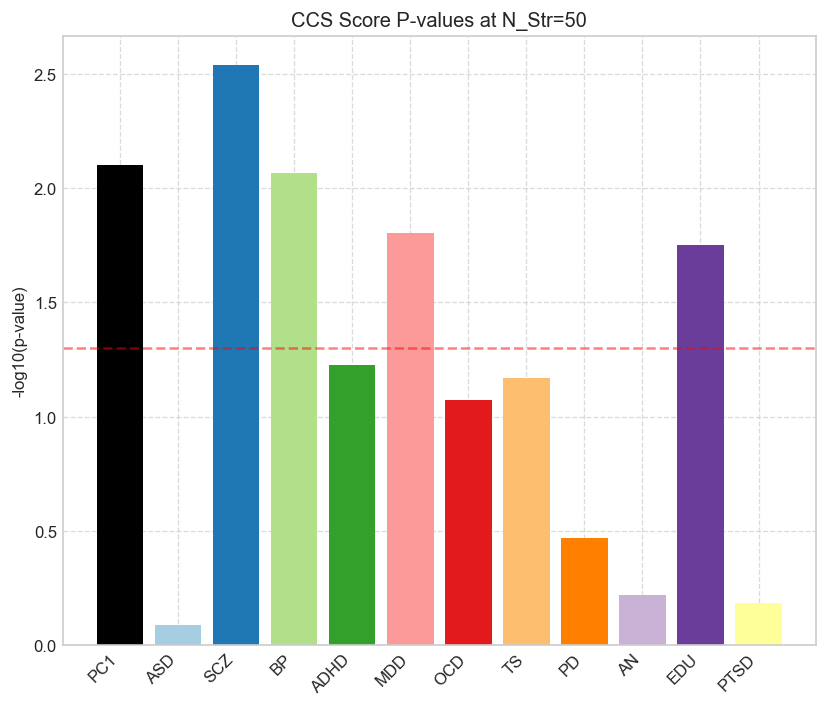

In [42]:
# Create figure and axis
fig, ax = plt.subplots(figsize=(7,6), dpi=120)

# Store p-values in a dictionary
pvalues = {}

# Get p-value for PC1
n = 50
obs = PC1_scores[np.where(topNs==n)][0]  # Extract scalar value
Null = Cont_Distance[:, np.where(topNs==n)].flatten()
z, p, xx = GetPermutationP(Null, obs)
pvalues['PC1'] = p

# Get p-values for each disorder
for disorder in PGC_Trait_Names:
    obs = disorder_scores[disorder][np.where(topNs==n)][0]  # Extract scalar value
    Null = Cont_Distance[:, np.where(topNs==n)].flatten()
    z, p, xx = GetPermutationP(Null, obs)
    pvalues[disorder] = p

# Create bar plot
labels = ['PC1'] + list(PGC_Trait_Names)
values = [-np.log10(pvalues[label]) for label in labels]
colors_bar = ['black'] + colors

# Ensure colors_bar has the same length as labels
if len(colors_bar) != len(labels):
    colors_bar = ['black'] + colors[:len(labels)-1]

# Create bars with error handling for array inputs
bars = ax.bar(range(len(labels)), values, color=colors_bar)

# Set properties that might have array inputs
for bar in bars:
    bar.set_linewidth(1.0)  # Use scalar value instead of potential array

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_ylabel('-log10(p-value)')
ax.set_title('CCS Score P-values at N_Str=50')
ax.grid(True, linestyle='--', alpha=0.7)

# Add significance threshold line at p=0.05
ax.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.5)

# Print numeric values
print("CCS score P-values at N_Str=50:")
print(f"PC1: {pvalues['PC1']:.2e}")
for disorder in PGC_Trait_Names:
    print(f"{disorder}: {pvalues[disorder]:.2e}")

plt.tight_layout()


In [43]:
Jon_PSD_list = "88 102 107 114 118 119 120 150 375 476 491 538 575 577 613 659 664 747 775 815 832 1000 1020 1128 1136 1499 1500 1501 1612 1627 1630 1739 1740 1741 1742 1785 1821 1838 1855 1948 1949 2039 2043 2059 2066 2171 2185 2332 2534 2596 2785 2852 2890 2891 2892 2893 2894 2895 2897 2898 2899 2900 2901 2902 2903 2904 2905 2906 2911 2913 2915 3184 3188 3337 3631 3646 3708 3756 3836 4038 4131 4218 4355 4744 4804 4842 4897 4905 4915 4985 5028 5062 5063 5064 5071 5093 5094 5142 5170 5582 5590 5621 5662 5728 5800 5802 6009 6128 6129 6132 6136 6156 6169 6175 6188 6207 6208 6222 6223 6230 6232 6252 6334 6457 6536 6543 6546 6547 6695 6711 6790 6792 6801 6853 6854 7074 7248 7249 7428 7732 7779 8087 8224 8440 8502 8516 8661 8777 8787 8825 8831 8851 8898 8927 8997 9026 9045 9101 9148 9162 9194 9201 9228 9229 9231 9419 9454 9455 9456 9463 9478 9495 9513 9743 9746 9762 9829 9863 9867 9890 9912 9921 9922 10006 10142 10243 10280 10313 10368 10369 10458 10486 10505 10509 10611 10636 11122 11178 11331 11346 22829 22849 22865 22866 22871 22883 22941 22986 22997 23043 23208 23229 23237 23362 23380 23413 23426 23513 23542 23623 23705 23767 25945 25978 26012 26037 26045 26052 27020 27091 27092 27185 27445 28964 28988 29102 29904 50488 50944 51104 51201 51225 54477 54487 54583 54910 55327 55450 55607 55737 56899 56924 57120 57142 57479 57502 57537 57554 57622 57679 57689 58489 58512 59283 59284 64084 64101 64130 64506 66000 78999 79414 79870 79953 80315 80725 80758 80852 80863 81831 81832 81926 84062 84435 84687 85358 85461 94030 112476 114798 116443 116444 145581 145773 146395 152404 158866 160622 200933 201191 254263 339451 347731 373509 388135 388336 392862 400745 401190 440073 440829 642938 729956 729993 100131897"
Jon_PSD_list = [int(x) for x in Jon_PSD_list.split(" ")]
Jon_PSD_GW = dict(zip(Jon_PSD_list, np.ones(len(Jon_PSD_list))))
MouseSTR_PSD = MouseSTR_AvgZ_Weighted(BiasMat, Jon_PSD_GW)
MouseSTR_PSD = add_class(MouseSTR_PSD, AnnoSTR)
MouseSTR_PSD.to_csv("/home/jw3514/Work/UNIMED/results/goterms/MouseSTR_PSD.csv")

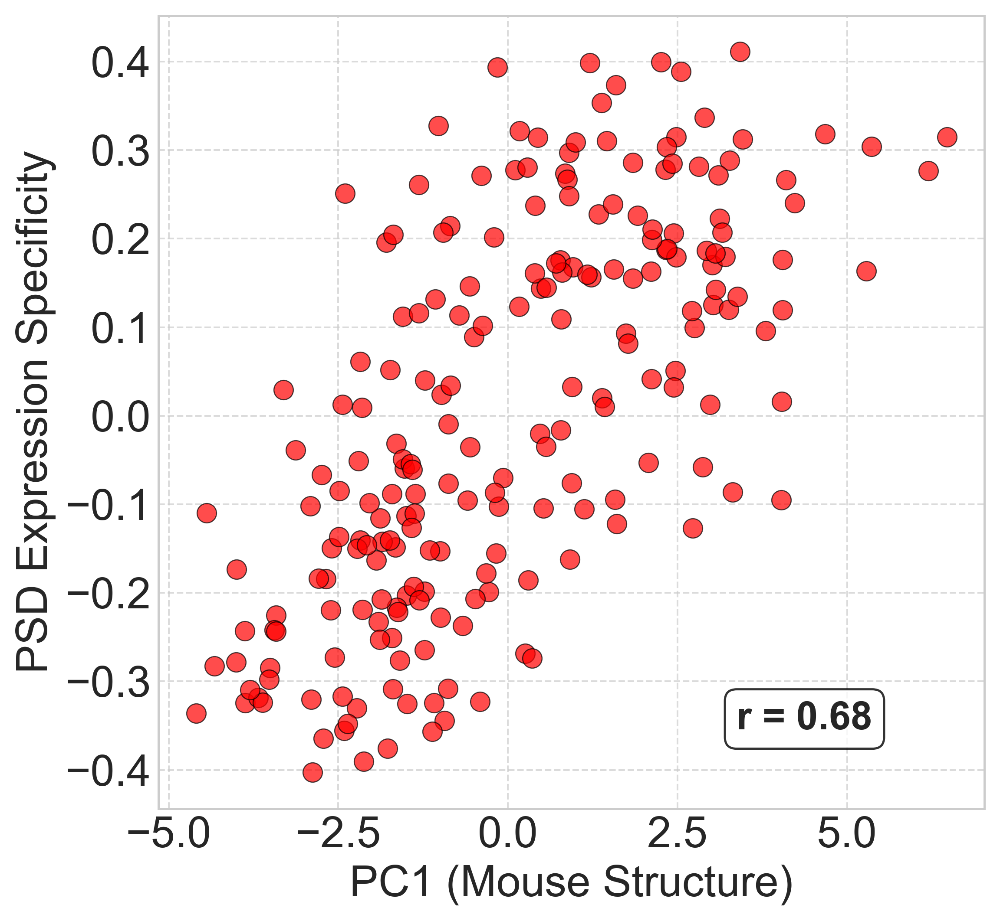

In [58]:
plot_effect_vs_pfactor_mouseSTR(mouseSTR_bias_pc_scores_df, MouseSTR_PSD, "PC1 (Mouse Structure)", "PSD Expression Specificity", label1="PC1", label2="EFFECT")

#### Remove PC1 

In [48]:
pc1_effect = mouseSTR_bias_pca_result[:, 0].reshape(-1, 1) @ mouseSTR_bias_pca.components_[0].reshape(1, -1)
residuals = MouseSTR_Bias_scaled - pc1_effect
residueDF = pd.DataFrame(residuals, 
             columns=All_Bias_DF_Spec.columns,
             index=All_Bias_DF_Spec.index)

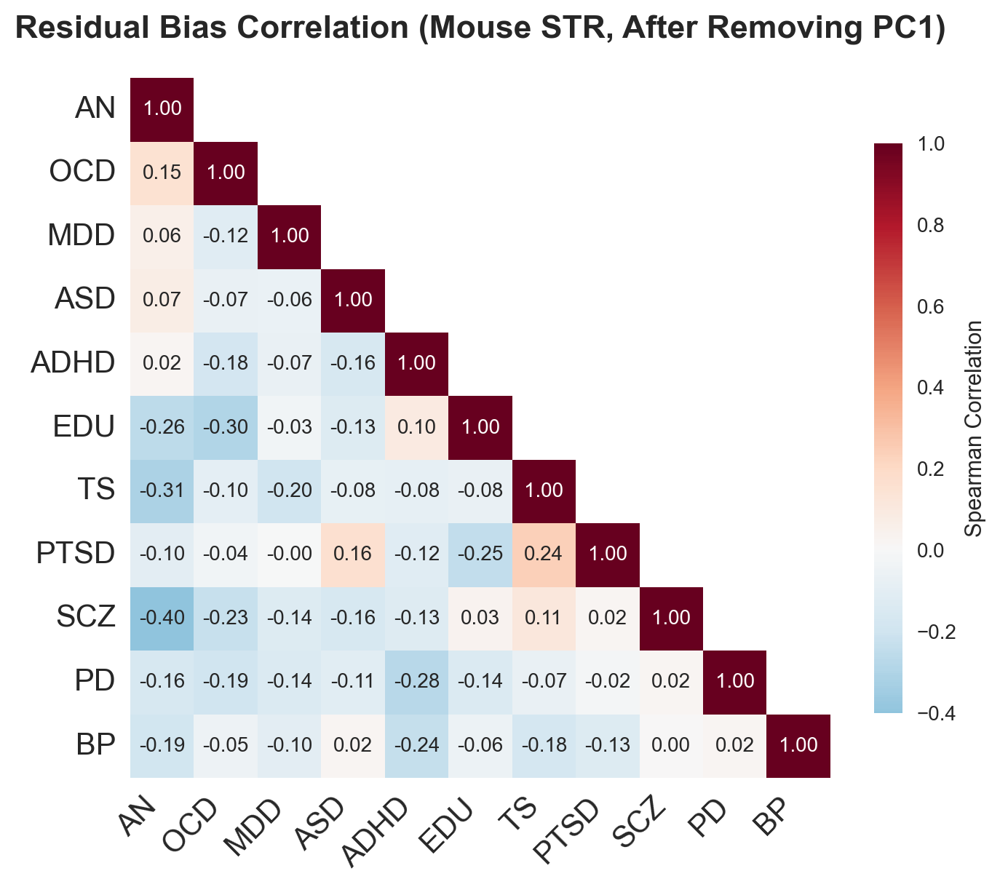

In [49]:
MouseSTR_ResidueBias_Correlation = plot_disorder_correlation_heatmap(residueDF, "Residual Bias Correlation (Mouse STR, After Removing PC1)")

In [50]:
def plot_pc1_boxplot_structure(pc_scores_df, Regions, REG2STR, PC):
    # Set style for publication quality
    plt.style.use('default')
    fig, ax = plt.subplots(figsize=(8,4), dpi=300)

    # Create list to store data for boxplot and calculate means for sorting
    box_data = []
    tick_labels = []
    means = []

    # Collect data and means for each cell type
    for Reg in Regions:
        #print(Reg)
        STRs = REG2STR[Reg]
        valid_STRs = [str for str in STRs if str in pc_scores_df.index]
        dat = pc_scores_df.loc[valid_STRs, PC]
        box_data.append(dat)
        tick_labels.append(Reg)
        means.append(dat.mean())

    # Sort everything by means
    sorted_indices = np.argsort(means)
    box_data = [box_data[i] for i in sorted_indices]
    tick_labels = [tick_labels[i] for i in sorted_indices]

    # Create boxplot with custom style
    bp = ax.boxplot(box_data, patch_artist=True, medianprops=dict(color="black", linewidth=1.5),
                    boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                    whiskerprops=dict(linewidth=1.5),
                    capprops=dict(linewidth=1.5),
                    flierprops=dict(marker='o', markerfacecolor='gray', markersize=4,
                                  linestyle='none', markeredgecolor='gray'))

    # Add individual points
    for i, data in enumerate(box_data):
        # Add jitter to x-coordinates
        x = np.random.normal(i + 1, 0.04, size=len(data))
        ax.scatter(x, data, alpha=0.4, s=20, c='black', zorder=2)

    # Customize plot
    ax.set_xticklabels(tick_labels, rotation=45, ha='right', fontsize=10)
    ax.set_ylabel(f'{PC} Score', fontsize=12)
    ax.set_title(f'Distribution of {PC} Scores by Brain Region', fontsize=14, pad=20)
    
    # Add subtle grid only for y-axis
    ax.yaxis.grid(True, linestyle='--', alpha=0.3)
    ax.set_axisbelow(True)
    
    # Remove top and right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Thicken remaining spines
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    
    # Adjust tick parameters
    ax.tick_params(axis='both', width=1.5, length=6)

    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    plt.show()

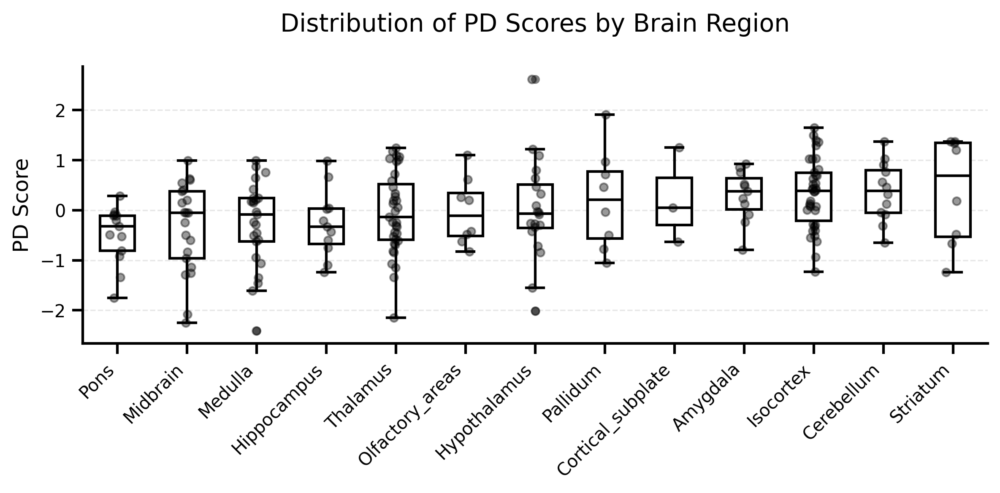

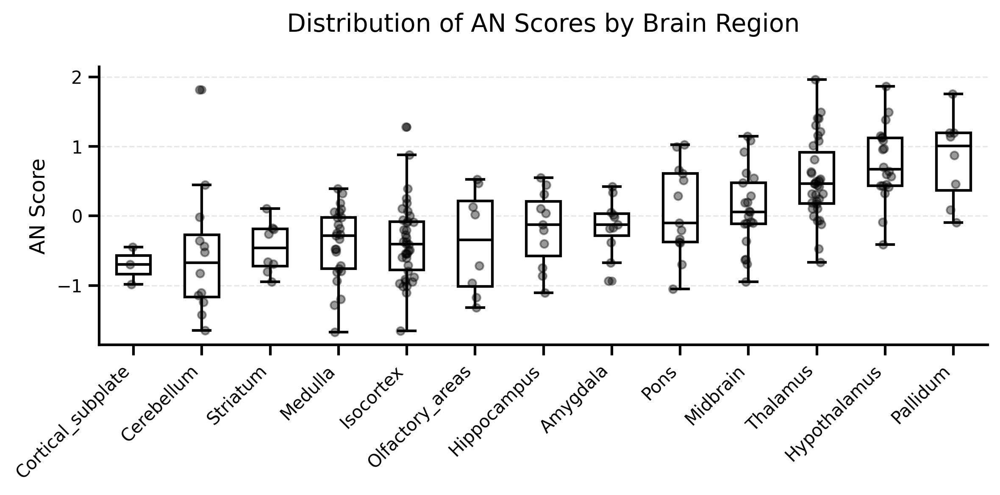

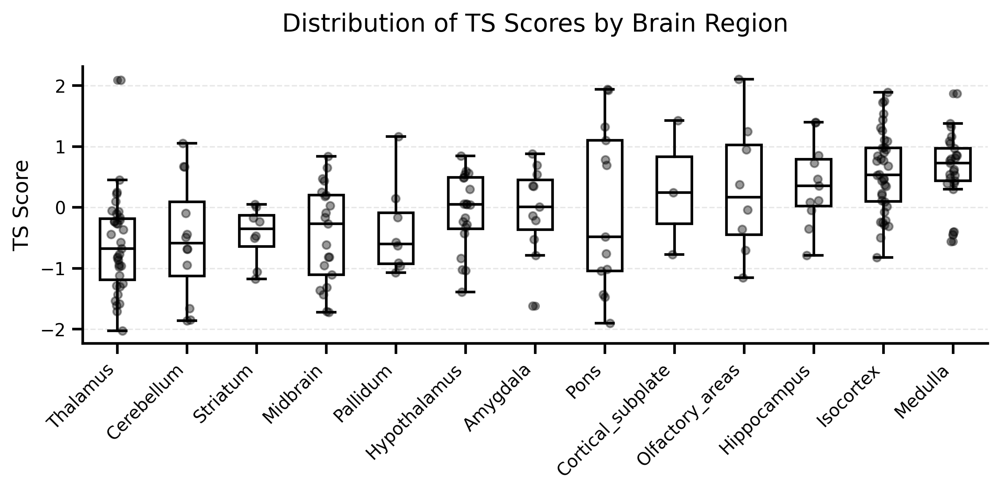

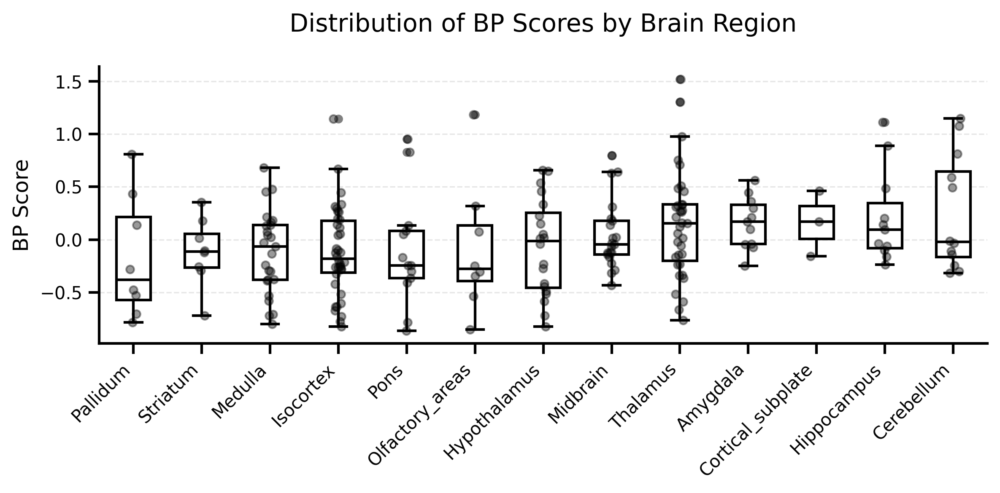

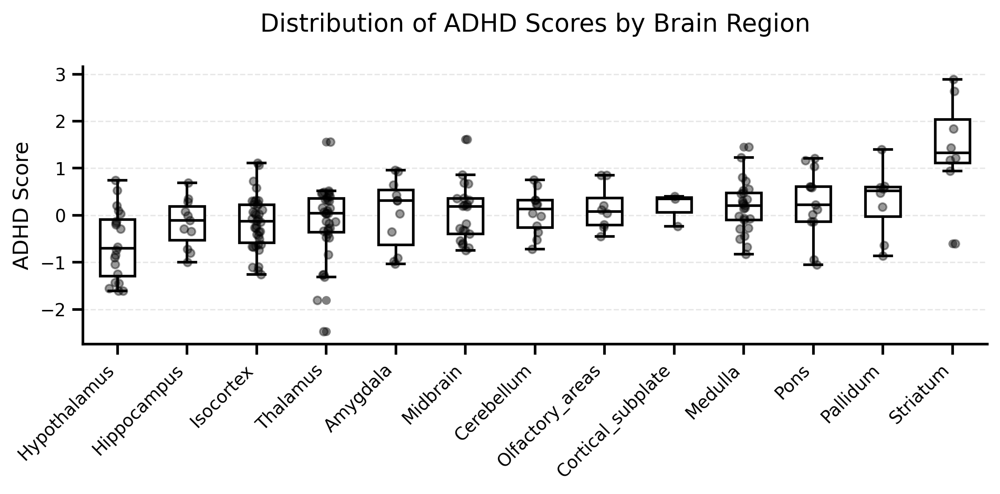

...

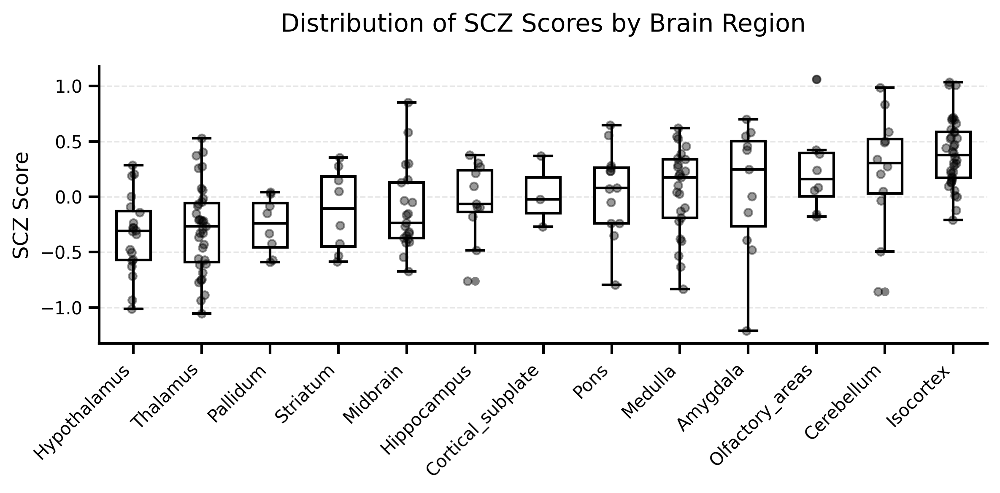

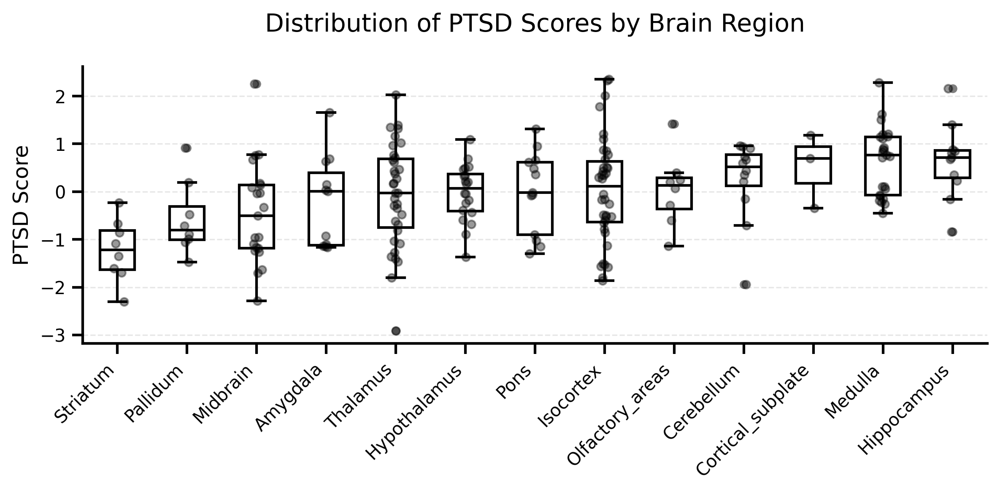

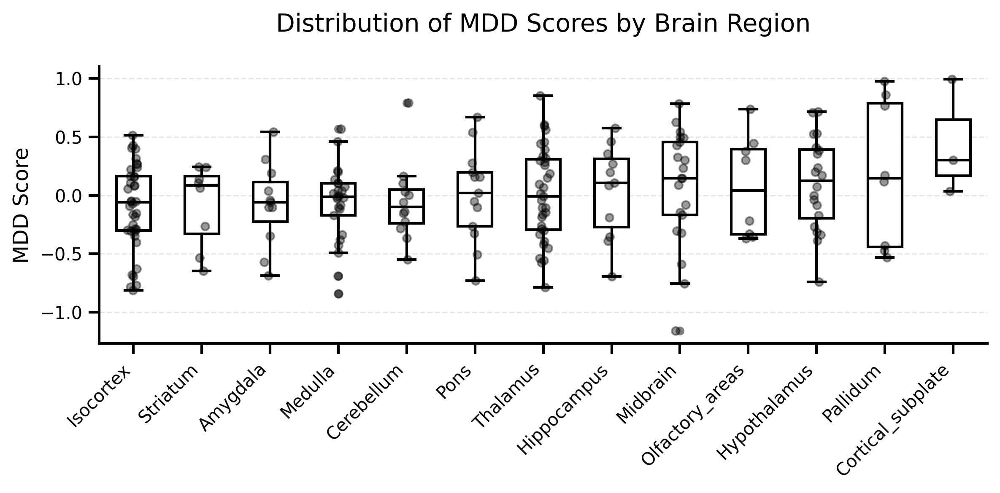

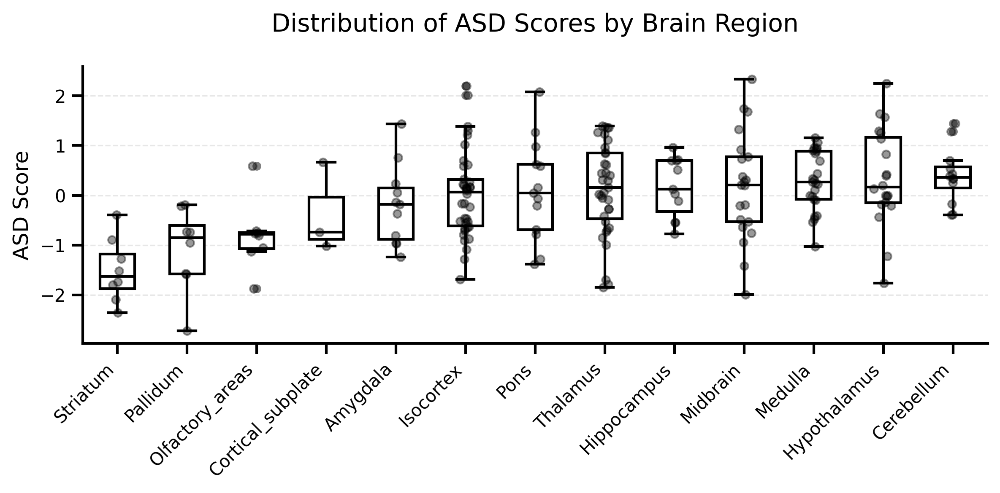

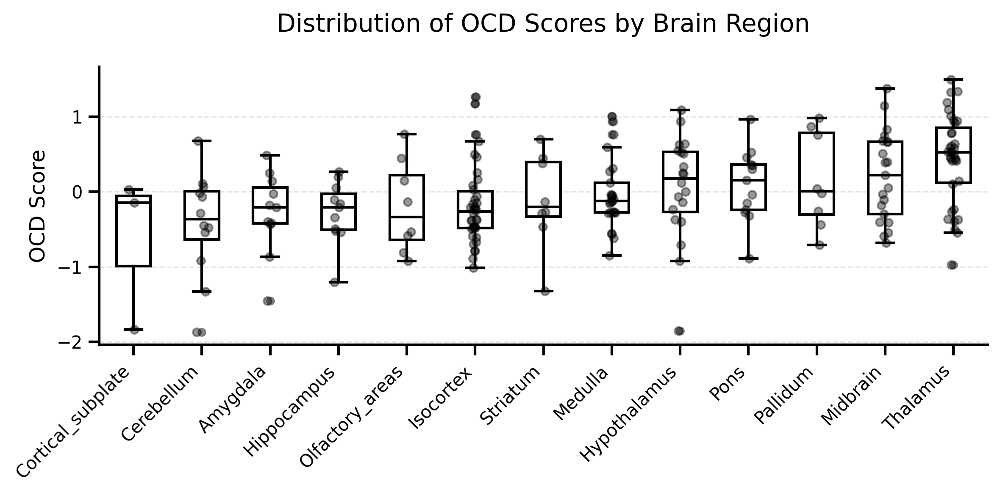

In [51]:
for Disorder in residueDF.columns.values:
   #plot_pc1_boxplot(residueDF, Anno, ALL_CTs, Disorder, Disorder)
   plot_pc1_boxplot_structure(residueDF, Regions, REG2STR, Disorder)

In [56]:
residueDF.loc[:, "ADHD"].sort_values(ascending=False).head(20)

Structure
Lateral_septal_nucleus_caudal_caudodorsal_part       2.886549
Septofimbrial_nucleus                                2.640563
Caudoputamen                                         1.834993
Central_linear_nucleus_raphe                         1.617653
Parafascicular_nucleus                               1.556758
Lateral_reticular_nucleus                            1.448588
Olfactory_tubercle                                   1.436502
Medial_septal_nucleus                                1.399188
Nucleus_raphe_magnus                                 1.229774
Fundus_of_striatum                                   1.221944
Nucleus_incertus                                     1.212512
Nucleus_accumbens                                    1.170281
Superior_central_nucleus_raphe                       1.166793
Posterior_parietal_association_areas                 1.110192
Retrosplenial_area_lateral_agranular_part            1.062748
Pontine_reticular_nucleus_caudal_part                1.04105

In [60]:
LOEUF = pd.read_csv("/home/jw3514/Work/UNIMED/dat/LOEUF_Rankings.csv", index_col="EntrezID")
# take top 10 decile 
topN = LOEUF.shape[0]//10
LOEUF_top10 = LOEUF.sort_values("LOEUF", ascending=True).head(topN)
print(LOEUF_top10.shape)
LOEUF_top10_GW = dict(zip(LOEUF_top10.index, np.ones(len(LOEUF_top10))))
MouseSTR_LOEUF_Spec = MouseSTR_AvgZ_Weighted(BiasMat, LOEUF_top10_GW)
#MouseSTR_LOEUF_Spec = add_class(MouseSTR_LOEUF_Spec, AnnoSTR)
MouseSTR_LOEUF_Spec.to_csv("/home/jw3514/Work/UNIMED/results/goterms/MouseSTR_LOEUF_Spec.csv")

(1800, 4)


In [61]:
MouseSTR_LOEUF_Spec.head(2)

,EFFECT,Rank
Structure,,
Dentate_gyrus,0.274489,1
Accessory_olfactory_bulb,0.235425,2
